<a href="https://colab.research.google.com/github/thesevenbluesky/fastbook/blob/master/Chapter_2_of_the_book.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install fsspec==2024.9.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 15.5 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [3]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 35.9 MB/s eta 0:00:00
Mounted at /content/gdrive


In [4]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [5]:
!pip install fastai duckduckgo-search


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 52.9 MB/s eta 0:00:00


In [6]:
from duckduckgo_search import DDGS


In [7]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

In [8]:
results = DDGS().images(keywords='grizzly bear', max_results=10)
ims = [res['image'] for res in results if res.get('image') is not None]



In [9]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

Path('images/grizzly.jpg')

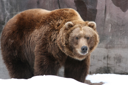

In [10]:
im = Image.open(dest)
im.to_thumb(128,128)

In [11]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')

In [12]:
from pathlib import Path

bear_types = ['grizzly', 'black', 'teddy']
path = Path('bears')

if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = path / o  # Create subfolder for each bear type
        dest.mkdir(exist_ok=True)
        print(f"Folder created: {dest}")

        # Use DDG to search for images
        results = search_images_ddg(f'{o} bear', 150)

        # Pass valid image URLs to download_images
        download_images(dest, urls=results)


Folder created: bears/grizzly
Folder created: bears/black
Folder created: bears/teddy


In [13]:
help(search_images_ddg)

Help on function search_images_ddg in module fastbook:

search_images_ddg(term, max_images=200)
    Search for `term` with DuckDuckGo and return a unique urls of about `max_images` images



In [14]:
for o in bear_types:
    dest = path / o  # Create subfolder for each bear type
    dest.mkdir(exist_ok=True)
    print(f"Folder created: {dest}")

    # Use DDG to search for images
    print(f"Searching for '{o} bear'...")
    results = search_images_ddg(f'{o} bear', 200)
    print(f"Found {len(results)} images for '{o} bear': {results[:5]}")  # Display the first 5 URLs

    # Pass valid image URLs to download_images
    if results:
        download_images(dest, urls=results)
    else:
        print(f"No results found for '{o} bear'. Skipping...")


Folder created: bears/grizzly
Searching for 'grizzly bear'...
Found 200 images for 'grizzly bear': ['https://static01.nyt.com/images/2023/01/20/multimedia/20xp-avian-grizzly-bear/20xp-avian-grizzly-bear-videoSixteenByNine3000.jpg', 'http://4.bp.blogspot.com/-ocppOkj9hTc/UNMpyLQ-XCI/AAAAAAAAADU/SrOUp6pvTSA/s1600/grizzly+bear.jpg', 'https://cms.qz.com/wp-content/uploads/2016/05/pizzlies_1.jpg?quality=75&strip=all&w=950&h=534', 'http://3.bp.blogspot.com/_VgXaDXiFvX4/TOLc3PVN7cI/AAAAAAAAA9U/ZTTZmy3MkYk/s1600/Grizzly_Bear+1.jpg', 'https://images.squarespace-cdn.com/content/v1/61d4a6c6ff4dab0a05294ccc/27362d36-7c15-42af-85d6-852c94e13964/bear_grizzly_griz_neal+herbert.jpg']
Folder created: bears/black
Searching for 'black bear'...
Found 200 images for 'black bear': ['https://a-z-animals.com/media/animals/images/original/iStock-1132413864-1024x682.jpg', 'https://www.vmcdn.ca/f/files/shared/miscellaneous-stock-images/black-bears-adobestock_66396528.jpeg;w=960', 'https://nhpbs.org/wild/images/b

In [15]:
fns = get_image_files(path)
fns

(#964) [Path('bears/teddy/b6e3efae-1953-41ea-be28-51e869e3bf09.jpg'),Path('bears/teddy/65a1c09c-5c6e-4895-8f65-c69fd8a10f3c.jpg'),Path('bears/teddy/4fd7372e-50cd-45f8-93c3-d7bff55c5887.jpg'),Path('bears/teddy/297f8e18-6ca1-47b6-bfd6-6a6c9af17847.jpg'),Path('bears/teddy/46717617-b5a6-4e71-ae86-0ba3314a21d5.jpg'),Path('bears/teddy/bb5b4dcc-0aec-4412-84dd-b703c98a8abc.jpg'),Path('bears/teddy/4ced4333-6efe-495d-bd4f-6ec43dead23c.jpg'),Path('bears/teddy/14c4d191-3c02-47d6-b036-365ae8ca3bfe.jpg'),Path('bears/teddy/c5b62953-9f8a-4c32-8ede-a46316056283.jpeg'),Path('bears/teddy/20b1cd58-f75d-4932-ac20-181b15ec72e1.png')...]

In [16]:
from fastai.vision.utils import verify_images

failed = verify_images(get_image_files(path))


In [17]:
failed.map(Path.unlink);

In [18]:

verify_images(fns)

(#63) [Path('bears/teddy/714af7ed-f624-4f42-9a46-26dd7f174def.jpg'),Path('bears/teddy/e16b0f06-a02f-429d-ab16-8fdec3c20bd2.png'),Path('bears/teddy/bce79282-812e-41a0-a8fb-58b496fbe791.jpg'),Path('bears/teddy/e1e932c7-ace7-408a-a05f-32a9e561e430.jpg'),Path('bears/teddy/30fa769a-5dd1-41a5-ae0a-34eff30d1158.jpg'),Path('bears/teddy/643e8cfb-7cdf-412b-87eb-beefea0a3479.jpg'),Path('bears/teddy/74bf1d76-686d-4d05-a507-03b8ea4fdca4.jpg'),Path('bears/teddy/ae27699d-6cb3-476a-a314-66f5e3d1c71b.jpg'),Path('bears/teddy/c05822a2-346f-4ace-a6f9-c91a1f5eda7b.jpg'),Path('bears/teddy/84d31844-7fbc-4008-8cb5-8d28854567f4.jpeg')...]

In [19]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [20]:
dls = bears.dataloaders(path)

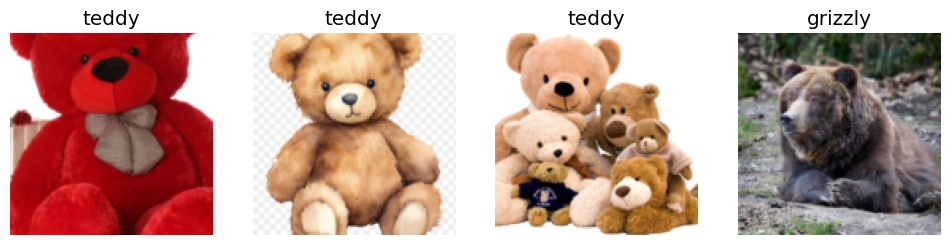

In [21]:
dls.valid.show_batch(max_n=4, nrows=1)

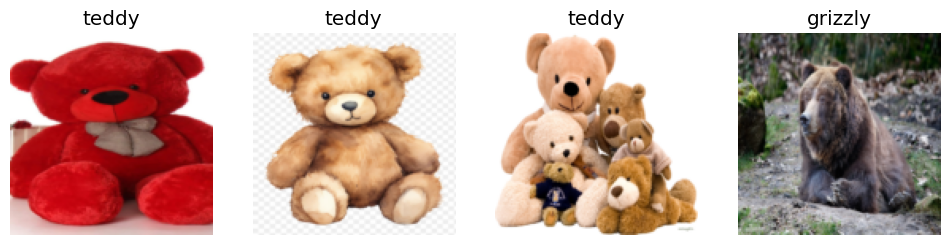

In [22]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

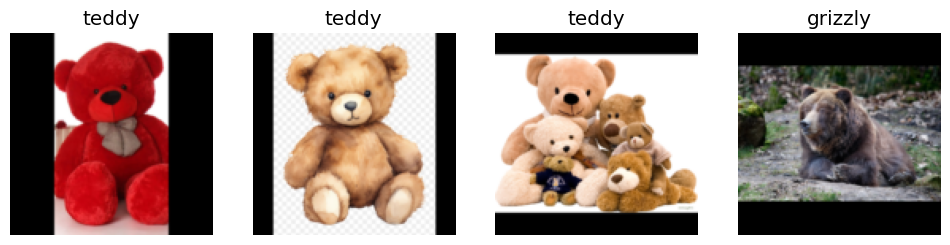

In [23]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

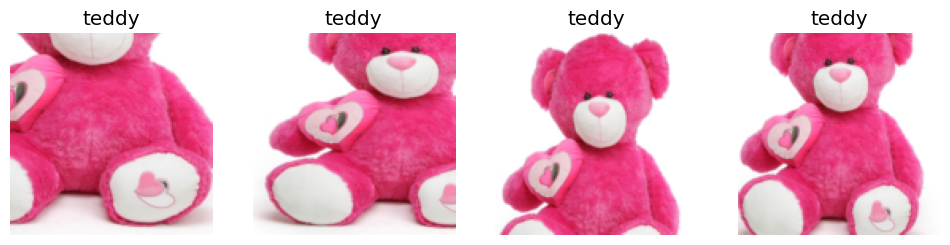

In [24]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

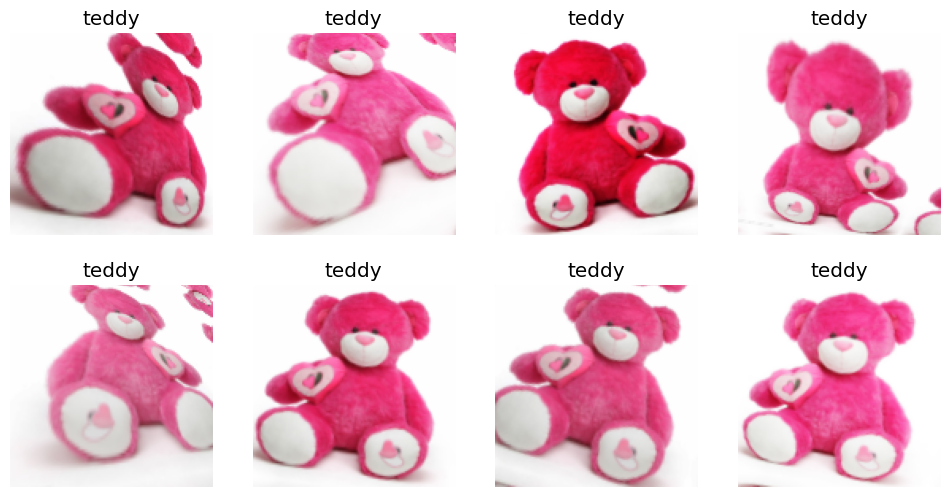

In [25]:

bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [26]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [27]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 172MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.774929,0.234069,0.050000,00:45


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.181742,0.135662,0.033333,00:48
1,0.143639,0.078957,0.027778,00:42
2,0.106199,0.076762,0.033333,00:46
3,0.090961,0.073250,0.027778,00:49


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in by

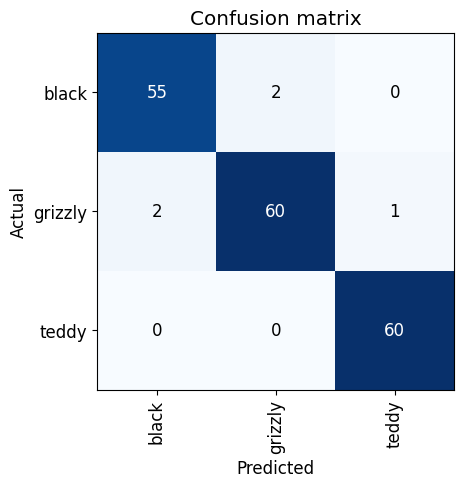

In [28]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

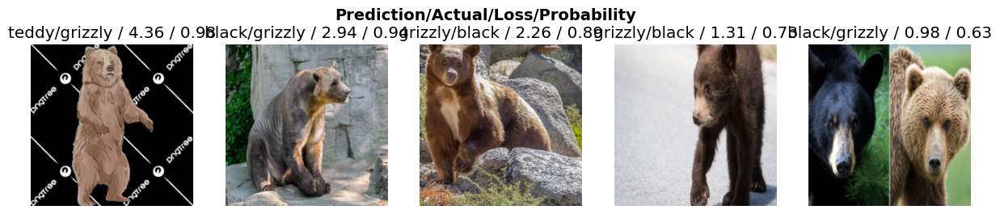

In [29]:
interp.plot_top_losses(5, nrows=1)

In [30]:
import os

# Replace 'folder_path' with your folder's path
folder_path = 'bears'

# List all files and folders in the directory
contents = os.listdir(folder_path)
print(contents)


['teddy', 'grizzly', 'black']


In [31]:
from pathlib import Path

# Define the main path where the bear folders are located
base_path = Path('bears')

# Loop through each bear type folder and list files
for bear_type in ['teddy', 'grizzly', 'black']:
    folder_path = base_path / bear_type
    if folder_path.exists():
        print(f"\nContents of folder '{bear_type}':")
        for file in folder_path.iterdir():
            print(file.name)
    else:
        print(f"\nFolder '{bear_type}' does not exist!")



Contents of folder 'teddy':
b6e3efae-1953-41ea-be28-51e869e3bf09.jpg
65a1c09c-5c6e-4895-8f65-c69fd8a10f3c.jpg
4fd7372e-50cd-45f8-93c3-d7bff55c5887.jpg
297f8e18-6ca1-47b6-bfd6-6a6c9af17847.jpg
46717617-b5a6-4e71-ae86-0ba3314a21d5.jpg
bb5b4dcc-0aec-4412-84dd-b703c98a8abc.jpg
4ced4333-6efe-495d-bd4f-6ec43dead23c.jpg
14c4d191-3c02-47d6-b036-365ae8ca3bfe.jpg
c5b62953-9f8a-4c32-8ede-a46316056283.jpeg
20b1cd58-f75d-4932-ac20-181b15ec72e1.png
a1fdbc0a-0dc9-4104-9d38-37d64337e84a.jpg
8227249f-148f-422a-9980-9c1c14f5753a.jpg
aedcb72e-dcd2-4036-90c3-d19b2487d4c9.jpg
719a44bb-4108-49a2-b926-72ad7b39a7e1.jpg
ee798893-7508-4ee3-a878-e889aa9db15a.webp
71d07f7b-83c0-4ad6-9ae7-50aa30bba856.jpg
05985d4a-940e-4653-8e8e-660af2b71e57.png
8b48c5f0-737d-4b2c-b141-018b65ed3324.jpg
b2da99b3-e417-4f0f-86eb-21cafe83be9c.jpg
b482c42a-26e0-4c59-a58a-8e48d9af6529.jpg
9f130267-4f5e-4f53-b890-dab0db8f0c30.jpg
49f27da3-47a8-4587-b74f-d8a6be517838.jpg
aac7f64a-e072-4113-8d48-9b2d9087112c.jpg
49f9d809-f20d-414b-b824-57

In [32]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [41]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [42]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [43]:
learn.export()

In [44]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [37]:
# print(os.listdir())   #TO find the current directory

['.config', 'images', 'gdrive', 'bears', 'export.pkl', 'sample_data']


In [45]:
learn_inf = load_learner(path/'export.pkl')

In [46]:
learn_inf.predict('images/grizzly.jpg')

('grizzly', tensor(1), tensor([2.1185e-04, 9.9977e-01, 1.5868e-05]))

In [47]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [49]:
#hide_output
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [55]:
img = PILImage.create(btn_upload.data[-1])

In [61]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [57]:
pred,pred_idx,probs = learn_inf.predict(img)

In [58]:
#hide_output
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: grizzly; Probability: 0.9996')

In [59]:
#hide_output
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [62]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [63]:
#hide_output
VBox([widgets.Label('Select your bear!'),
      btn_upload, btn_run, out_pl, lbl_pred])